## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Reading Data

In [2]:
df=pd.read_csv(r"D:\Data Science\Project\fake_bills.csv", sep=';')
df

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,4.42,3.09,111.28
1496,False,172.19,104.63,104.44,5.27,3.37,110.97
1497,False,171.80,104.01,104.12,5.51,3.36,111.95
1498,False,172.06,104.28,104.06,5.17,3.46,112.25


## EDA

In [3]:
df.describe()

,diagonal,height_left,height_right,margin_low,margin_up,length
count,1500.000000,1500.000000,1500.000000,1463.000000,1500.000000,1500.00000
mean,171.958440,104.029533,103.920307,4.485967,3.151473,112.67850
std,0.305195,0.299462,0.325627,0.663813,0.231813,0.87273
min,171.040000,103.140000,102.820000,2.980000,2.270000,109.49000
25%,171.750000,103.820000,103.710000,4.015000,2.990000,112.03000
50%,171.960000,104.040000,103.920000,4.310000,3.140000,112.96000
75%,172.170000,104.230000,104.150000,4.870000,3.310000,113.34000
max,173.010000,104.880000,104.950000,6.900000,3.910000,114.44000


In [4]:
df.duplicated().sum()

0

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_low    1463 non-null   float64
 5   margin_up     1500 non-null   float64
 6   length        1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


In [6]:
df.isna().sum()

is_genuine       0
diagonal         0
height_left      0
height_right     0
margin_low      37
margin_up        0
length           0
dtype: int64

## Handling missing values

In [7]:
x = df[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length','margin_low']]
x

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,3.09,111.28,4.42
1496,False,172.19,104.63,104.44,3.37,110.97,5.27
1497,False,171.80,104.01,104.12,3.36,111.95,5.51
1498,False,172.06,104.28,104.06,3.46,112.25,5.17


In [8]:
x=x.dropna()

In [9]:
len(x)

1463

In [10]:
y=df[df.margin_low.isnull()]

In [11]:
len(y)

37

In [12]:
y.columns

Index(['is_genuine', 'diagonal', 'height_left', 'height_right', 'margin_low',
       'margin_up', 'length'],
      dtype='object')

In [60]:
y= y[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length']]
y.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length
72,True,171.94,103.89,103.45,3.25,112.79
99,True,171.93,104.07,104.18,3.14,113.08
151,True,172.07,103.80,104.38,3.02,112.93
197,True,171.45,103.66,103.80,3.62,113.27
241,True,171.83,104.14,104.06,3.02,112.36


In [14]:
from sklearn.linear_model import LinearRegression

In [15]:
lg = LinearRegression()

In [16]:
x.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04


In [17]:
a=x.iloc[:,:-1]
b=x['margin_low']

In [18]:
lg.fit(a,b)
ypred=lg.predict(y)

In [19]:
ypred

array([4.06495361, 4.11199026, 4.13400328, 3.99357074, 4.1403993 ,
       4.09428392, 4.07412432, 4.12538999, 4.0807278 , 4.07363322,
       4.11897255, 4.18037978, 4.13648423, 4.05106842, 4.17837685,
       4.22555104, 4.11586845, 4.10284101, 4.08184346, 4.09276238,
       4.11250192, 4.15717623, 4.16028787, 4.12193808, 4.12353555,
       4.19842271, 4.10962313, 4.09696025, 4.13384101, 5.25968515,
       5.264817  , 5.28251853, 5.30206887, 5.20035843, 5.1754678 ,
       5.17345045, 5.24675055])

In [20]:
y['margin_low']=ypred

In [53]:
y.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
72,True,171.94,103.89,103.45,3.25,112.79,4.064954
99,True,171.93,104.07,104.18,3.14,113.08,4.111990
151,True,172.07,103.80,104.38,3.02,112.93,4.134003
197,True,171.45,103.66,103.80,3.62,113.27,3.993571
241,True,171.83,104.14,104.06,3.02,112.36,4.140399


In [22]:
x.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04


In [23]:
y.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
72,True,171.94,103.89,103.45,3.25,112.79,4.064954
99,True,171.93,104.07,104.18,3.14,113.08,4.111990
151,True,172.07,103.80,104.38,3.02,112.93,4.134003
197,True,171.45,103.66,103.80,3.62,113.27,3.993571
241,True,171.83,104.14,104.06,3.02,112.36,4.140399


In [24]:
df4=pd.concat([x,y], axis=0)

In [39]:
df4.reset_index(drop=True)

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1495,0,172.17,104.49,103.76,2.93,111.21,5.302069
1496,0,172.08,104.15,104.17,3.40,112.29,5.200358
1497,0,171.72,104.46,104.12,3.61,110.31,5.175468
1498,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [40]:
df4.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.52
1,1,171.46,103.36,103.66,2.99,113.09,3.77
2,1,172.69,104.48,103.50,2.94,113.16,4.40
3,1,171.36,103.91,103.94,3.01,113.51,3.62
4,1,171.73,104.28,103.46,3.48,112.54,4.04


In [41]:
df4.isna().sum()

is_genuine      0
diagonal        0
height_left     0
height_right    0
margin_up       0
length          0
margin_low      0
dtype: int64

In [42]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 0 to 1438
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   int64  
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_up     1500 non-null   float64
 5   length        1500 non-null   float64
 6   margin_low    1500 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 93.8 KB


In [43]:
df4['is_genuine']=df4['is_genuine'].replace({True:1})
df4['is_genuine']=df4['is_genuine'].replace({False:0})
df4

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1303,0,172.17,104.49,103.76,2.93,111.21,5.302069
1315,0,172.08,104.15,104.17,3.40,112.29,5.200358
1347,0,171.72,104.46,104.12,3.61,110.31,5.175468
1435,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [44]:
df4.corr()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
is_genuine,1.000000,0.132756,-0.379833,-0.485092,-0.606262,0.849285,-0.786177
diagonal,0.132756,1.000000,0.019472,-0.024492,-0.055649,0.097587,-0.110639
height_left,-0.379833,0.019472,1.000000,0.242279,0.246522,-0.320863,0.308724
height_right,-0.485092,-0.024492,0.242279,1.000000,0.307005,-0.401751,0.390948
margin_up,-0.606262,-0.055649,0.246522,0.307005,1.000000,-0.520575,0.429600
length,0.849285,0.097587,-0.320863,-0.401751,-0.520575,1.000000,-0.668445
margin_low,-0.786177,-0.110639,0.308724,0.390948,0.429600,-0.668445,1.000000


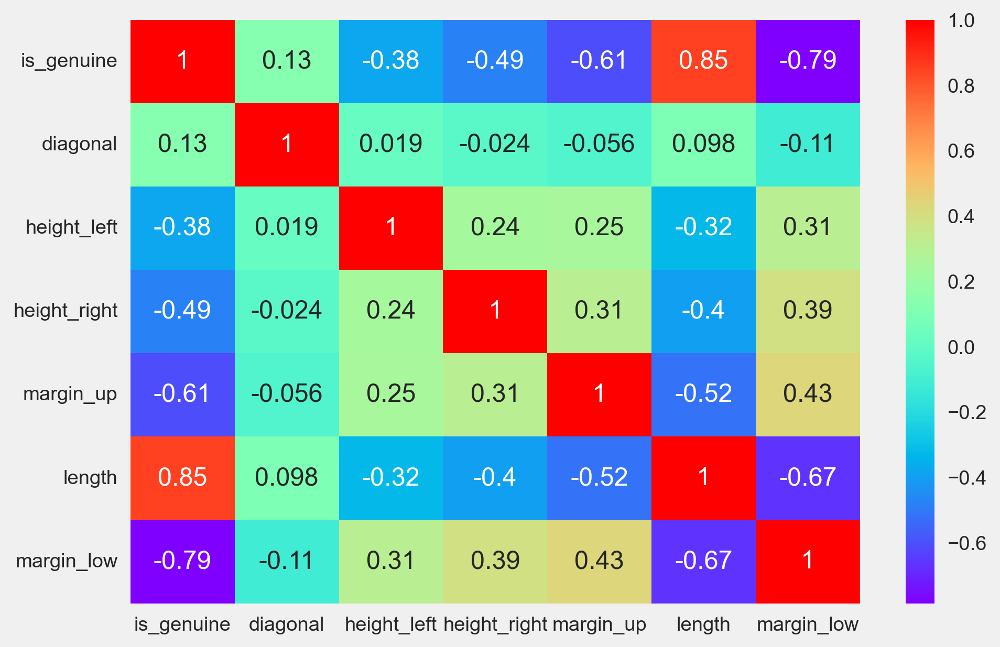

In [45]:
sns.heatmap(df4.corr(),cmap='rainbow',annot=True)
plt.show()

In [58]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

sns.set_style('darkgrid')

<AxesSubplot:xlabel='is_genuine', ylabel='count'>

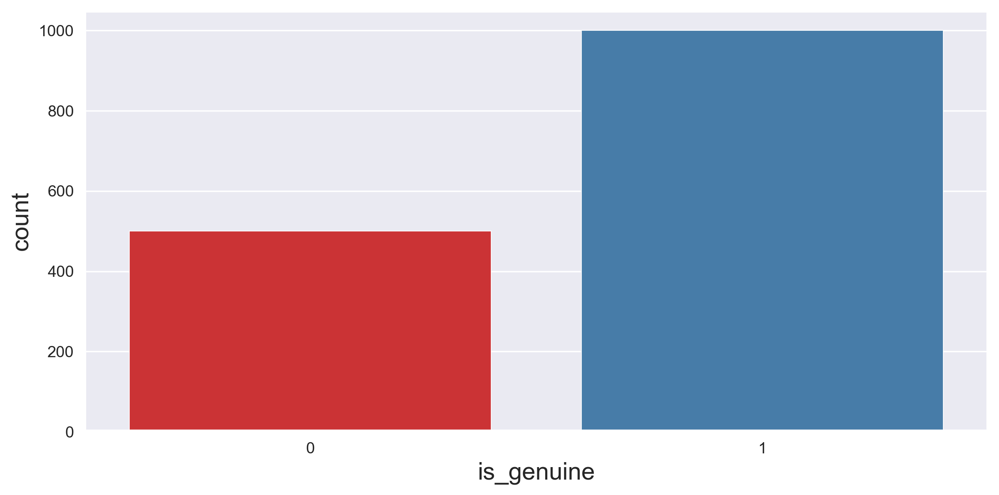

In [59]:
sns.countplot(data=df4,x='is_genuine')

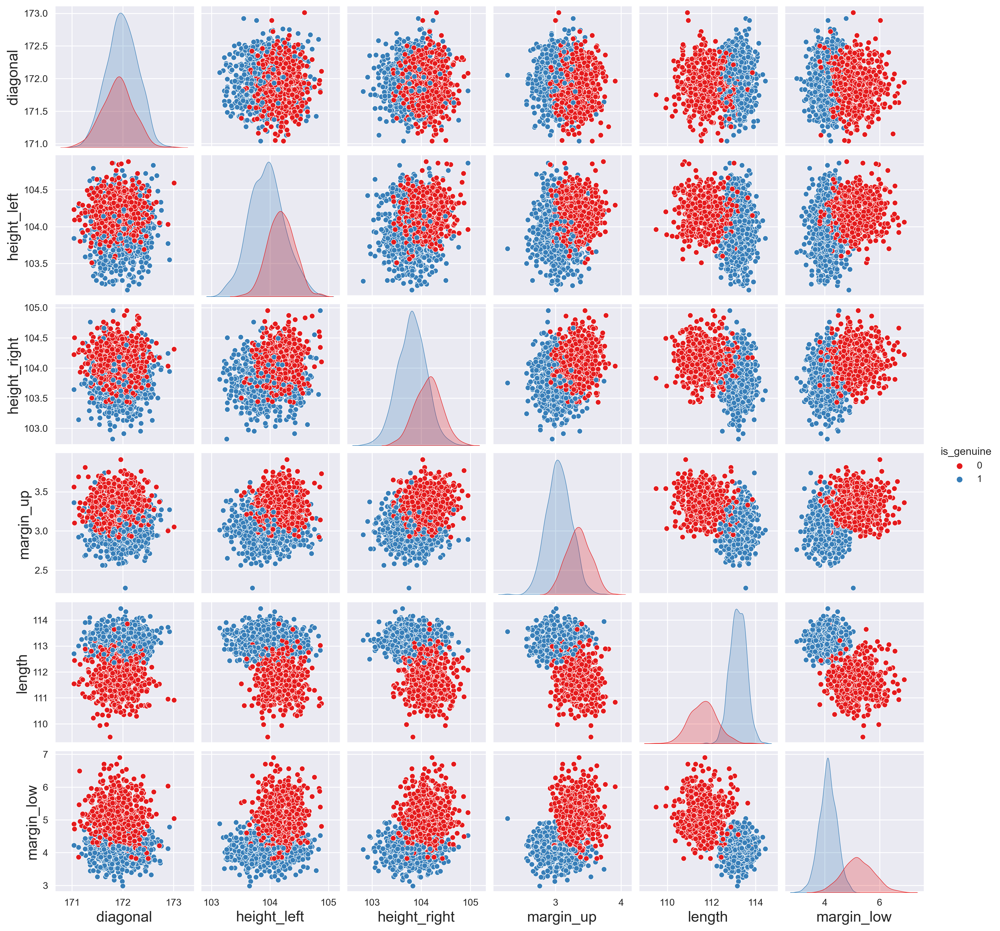

In [48]:
sns.pairplot(data=df4, hue='is_genuine')

In [51]:
columns=df4.columns

is_genuine


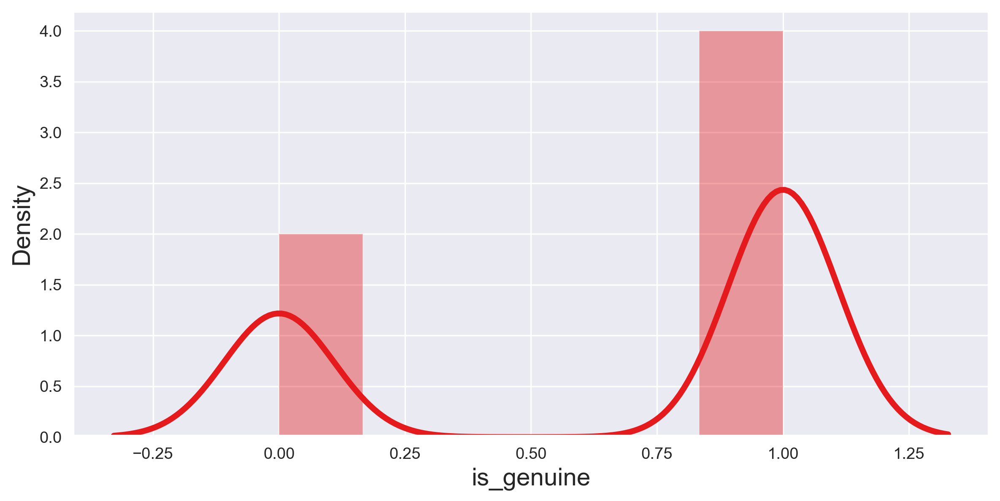

diagonal


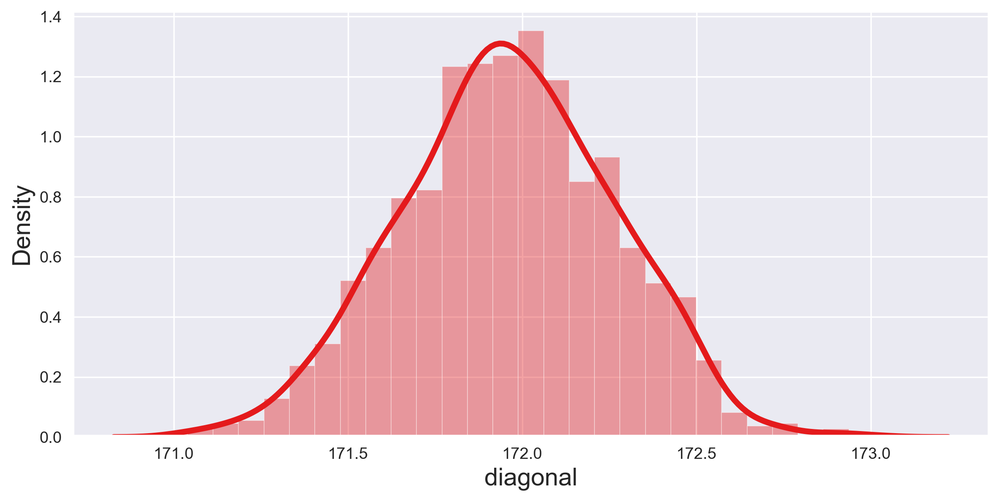

height_left


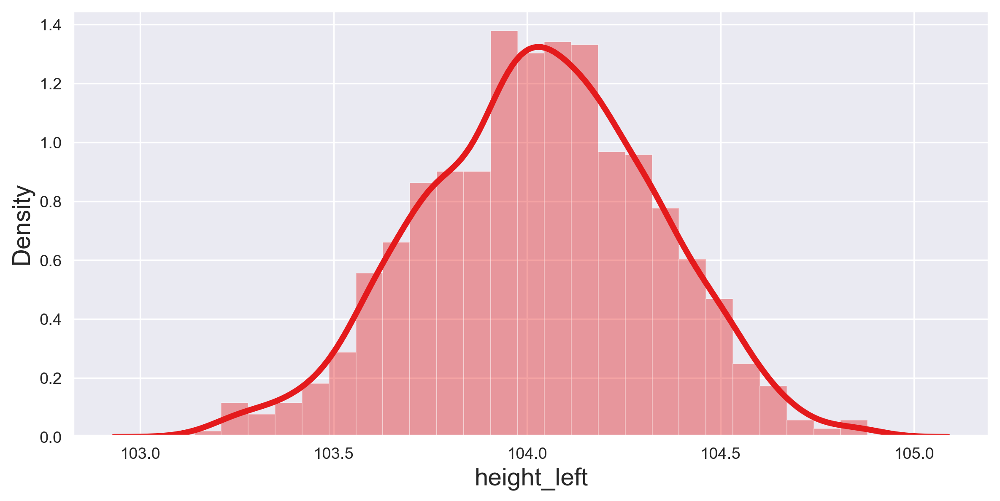

height_right


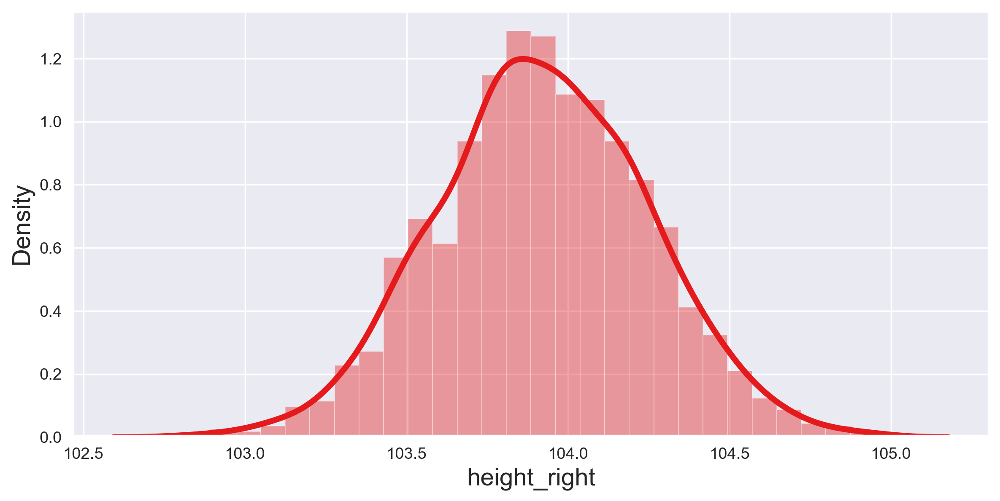

margin_up


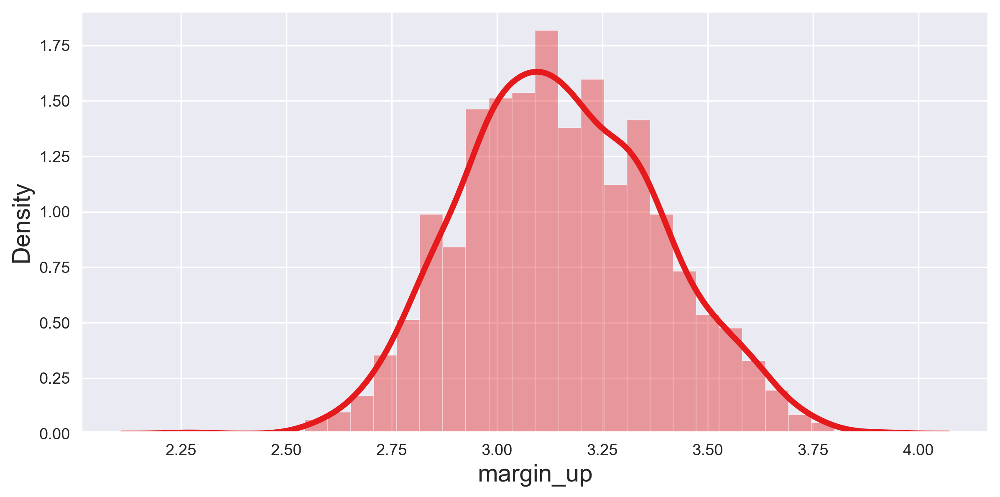

length


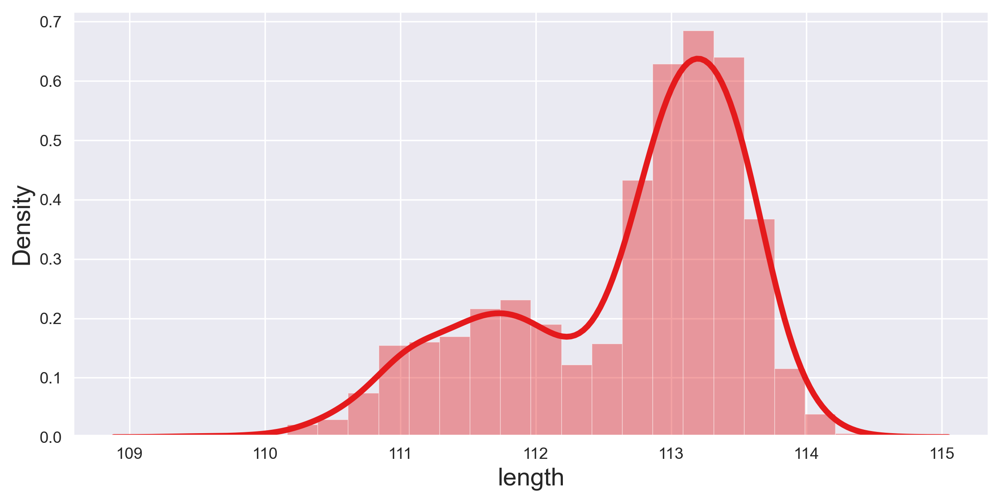

margin_low


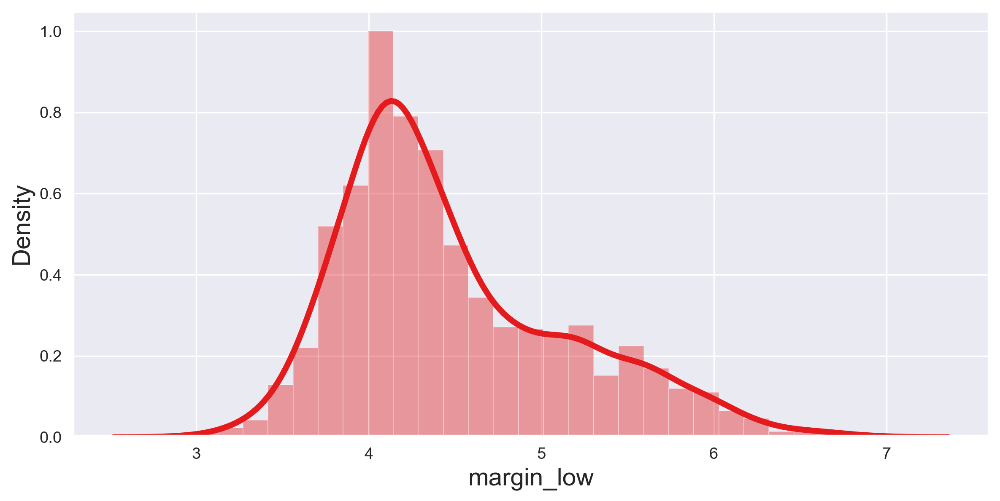

In [52]:
for i in columns:
    print(i)
    sns.distplot(df4[i])
    plt.show()

## Auto EDA with AutoViz

In [49]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

In [36]:
%matplotlib inline

Shape of your Data Set loaded: (1500, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 21


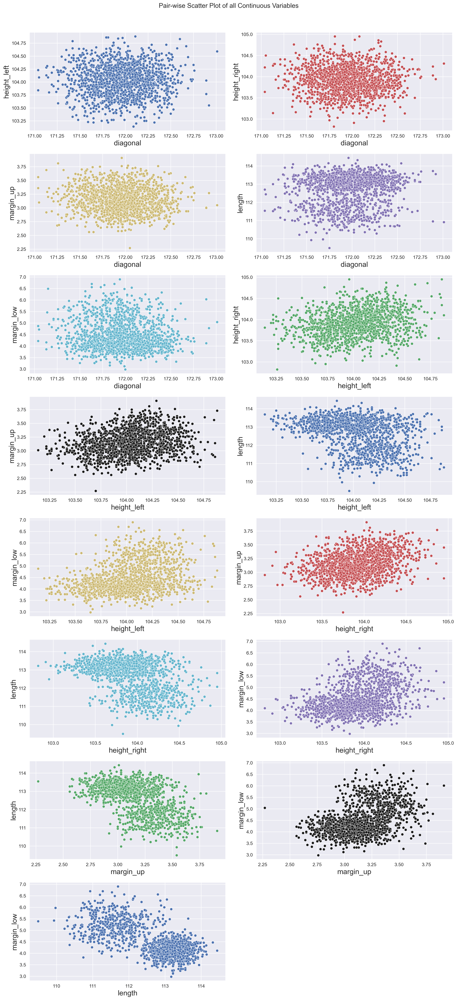

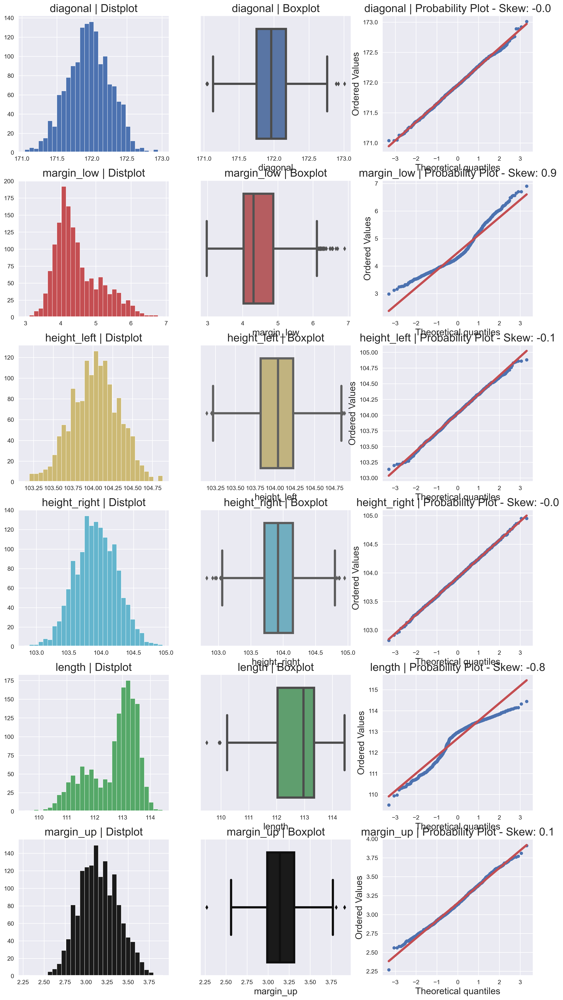

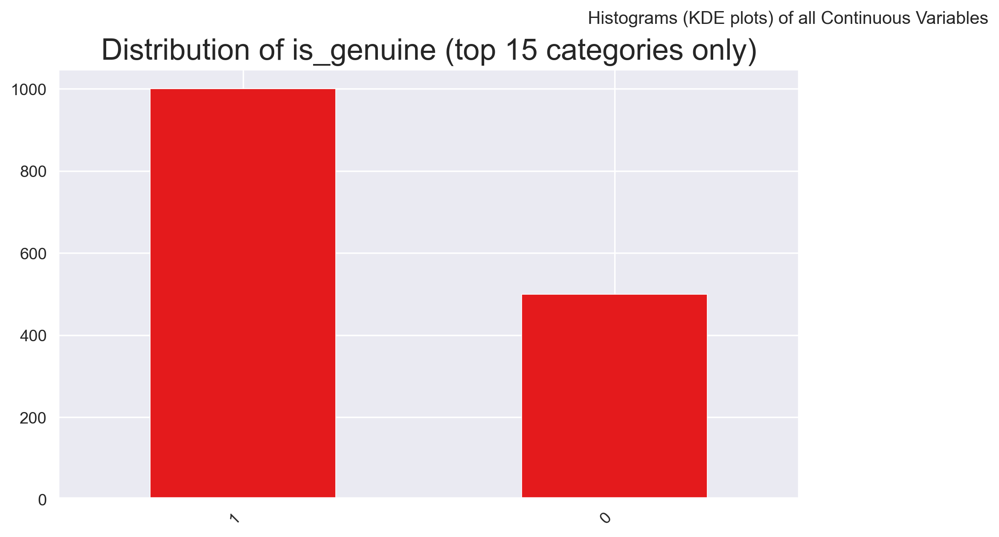

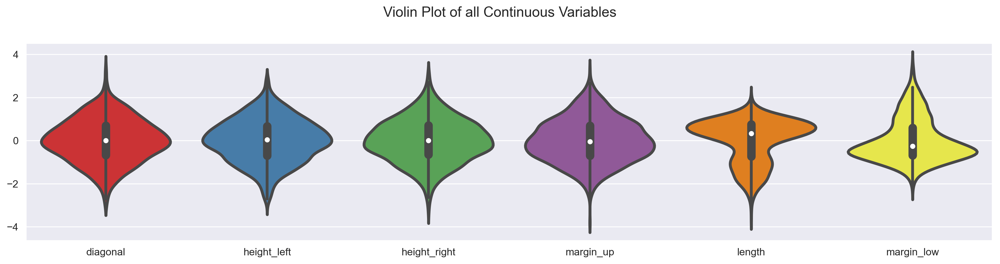

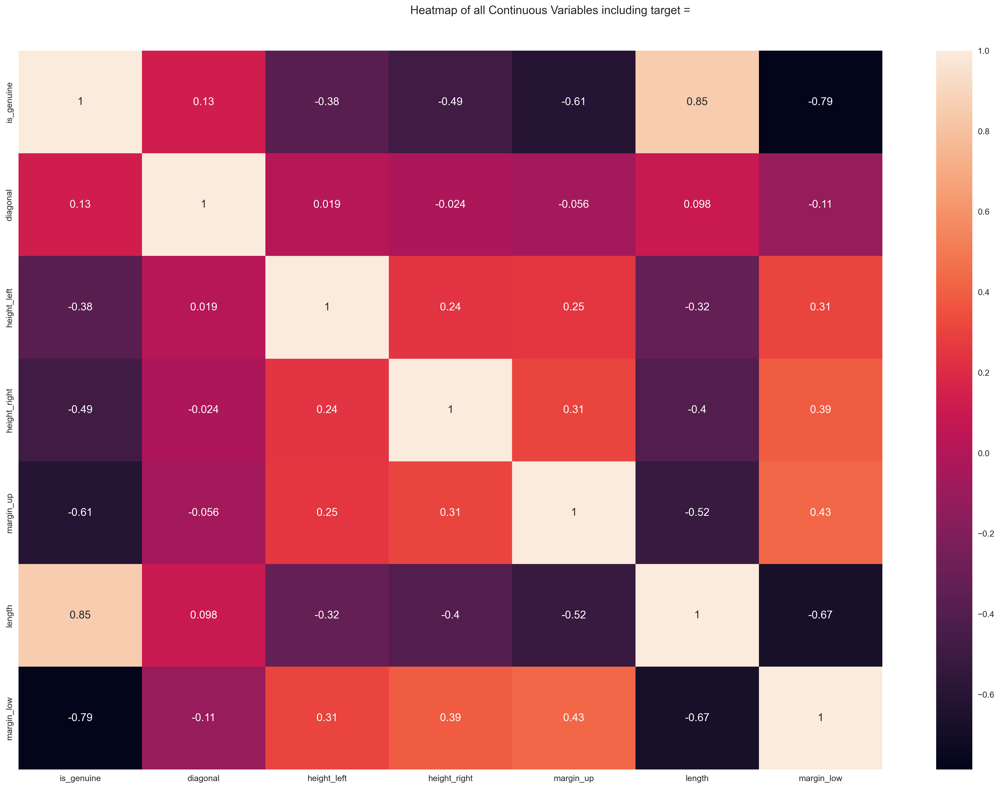

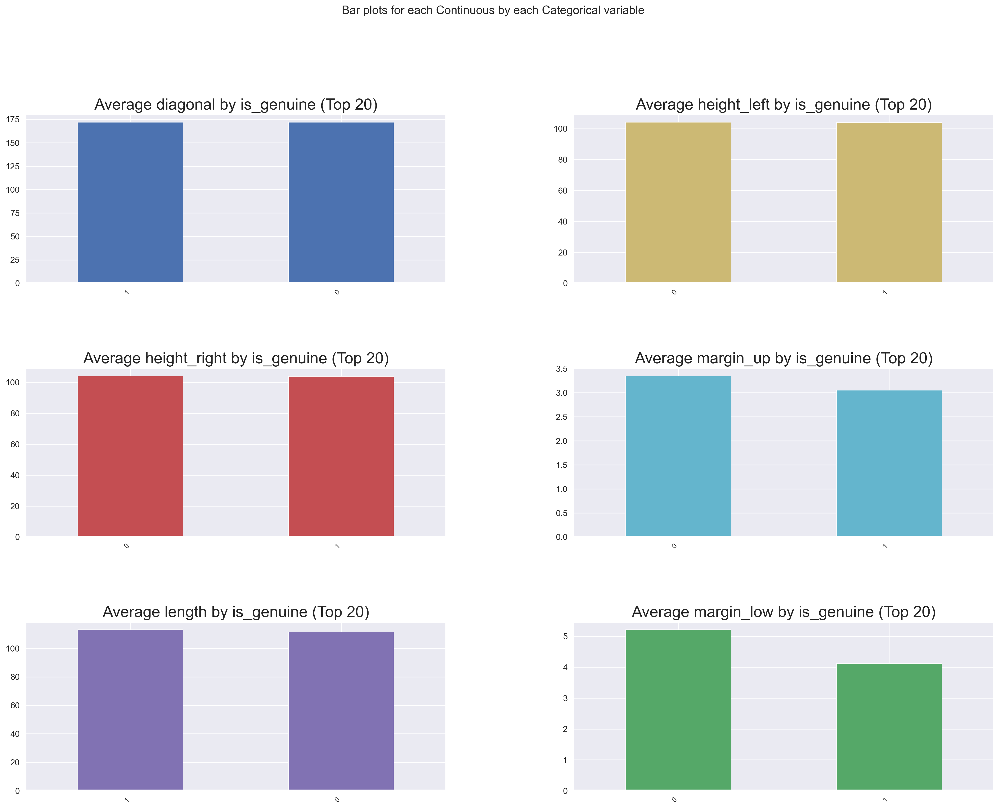

All Plots done
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [50]:
report = AV.AutoViz(filename='', sep ='' , depVar ='', dfte = df4, header = 0,
verbose = 0, lowess = False, chart_format ='svg', max_rows_analyzed = 150000, max_cols_analyzed = 30)